# library install

In [36]:
%pip install pandas matplotlib openpyxl
%pip install wordcloud
%pip install seaborn plotly kaleido scipy squarify

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


# Data Import

In [37]:
import pandas as pd

# Load the Excel file
file_path = 'cleaned data.xlsx'

# Read the Excel file into a DataFrame
df = pd.read_excel(file_path)

import re

# assuming your DataFrame is named df and the column is 'Name'
df['Name'] = df['Name'].str.replace(r'#\d+\s+in top sellers', '', regex=True).str.strip()


# Check the first few rows to see the column names
print(df.head())



   appid             genre                       Name  Discount %  Price  \
0     10  eSports, Shooter             Counter-Strike         NaN  349.0   
1     20           Shooter      Team Fortress Classic       -0.75   62.0   
2     30           Shooter              Day of Defeat       -0.75   62.0   
3     40           Shooter         Deathmatch Classic       -0.75   62.0   
4     50   Puzzle, Shooter  Half-Life: Opposing Force       -0.75   62.0   

   Rating Release Month  Release Year  Follows  Current Online    Peak  
0  0.9630           Nov        2000.0   219376           11272  319586  
1  0.8461           Apr        1999.0     9811              60    1897  
2  0.8749           May        2003.0     7364              63    7758  
3  0.7996           Jun        2001.0     2802               4     629  
4  0.9317           Nov        1999.0    11175             126    5639  


# word Cloud

In [5]:
import pandas as pd
import re
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Load the Excel file
file_path = "cleaned data.xlsx"
df = pd.read_excel(file_path)

# Clean the Release Year column
df["Release Year"] = pd.to_numeric(df["Release Year"], errors="coerce")
df = df.dropna(subset=["Release Year", "Name"])

# Common articles and stopwords to filter out
common_articles = {
    "a",
    "an",
    "the",
    "and",
    "or",
    "but",
    "in",
    "on",
    "at",
    "to",
    "for",
    "of",
    "with",
    "by",
    "from",
    "is",
    "are",
    "was",
    "were",
    "be",
    "been",
    "being",
    "have",
    "has",
    "had",
    "do",
    "does",
    "did",
    "will",
    "would",
    "could",
    "should",
    "may",
    "might",
    "must",
    "can",
    "this",
    "that",
    "these",
    "those",
    "sex",
    "edition",
    "game",
    "top",
    "sellers",
    "ii",
    "iii",
    ".",
    "adult",
    "deluxe",
}


# Function to extract and clean words from text
def extract_words(text):
    if pd.isna(text):
        return []

    # Convert to string and lowercase
    text = str(text).lower()

    # Remove special characters and split into words
    text = re.sub(r"[^a-z0-9\s]", " ", text)
    words = text.split()

    # --- Detect "gold" followed by "edition" in the raw token list BEFORE filtering ---
    skip_gold_indices = set()
    for i in range(len(words) - 1):
        if words[i] == "gold" and words[i + 1] == "edition":
            skip_gold_indices.add(i)
            # debug print showing context around the match
            print(
                f"Skipping 'gold' before 'edition' in original text: {' '.join(words[max(0, i - 3) : i + 4])}"
            )

    # Filter out common articles, numbers (0-9), and short words (less than 2 characters)
    filtered_words = [
        word
        for idx, word in enumerate(words)
        if idx not in skip_gold_indices
        and word not in common_articles
        and not word.isdigit()
        and len(word) > 1
    ]

    # 🔹 Smart plural normalization (avoid "chess" → "ches" and keep "heroes")

    normalized_words = []
    for w in filtered_words:
        if len(w) > 3:
            if w == "heroes":
                # keep "heroes" as is
                normalized_words.append(w)
                continue
            if re.match(r".*ies$", w):  # e.g. "bodies" -> "body"
                w = re.sub(r"ies$", "y", w)
            elif (
                re.match(r".*ses$", w)
                or re.match(r".*xes$", w)
                or re.match(r".*zes$", w)
            ):
                pass  # keep words like "chess", "boss", "buzzes"
            elif re.match(r".*s$", w) and not re.match(r".*(ss|us|is)$", w):
                w = re.sub(r"s$", "", w)
        normalized_words.append(w)

    return normalized_words


# Function to create a single word cloud for all years
def create_wordcloud_for_all_years(df, output_filename):
    # Extract all words from names in all years
    all_words = []
    for name in df["Name"]:
        words = extract_words(name)
        all_words.extend(words)

    if not all_words:
        print(f"No words found.")
        return

    # Count word frequencies
    word_counts = Counter(all_words)

    # 🎨 Custom color function favoring cool & light tones (blue–green–teal–yellow range)
    import colorsys
    import random

    max_freq = max(word_counts.values())

    def freq_color_func(
        word, font_size, position, orientation, font_path, random_state
    ):
        freq = word_counts.get(word, 1) / max_freq  # normalize 0–1
        # hue: random but restricted to blue–green–yellow range (≈ 160°–240°)
        hue = random_state.randint(160, 240) / 360.0
        # saturation: moderate to high for frequent words
        sat = 0.5 + 0.4 * freq
        # lightness: lighter for rare words, darker for common ones
        light = 0.7 - 0.4 * freq
        r, g, b = colorsys.hls_to_rgb(hue, light, sat)
        return f"rgb({int(r * 255)}, {int(g * 255)}, {int(b * 255)})"

    # Create base word cloud
    wordcloud = WordCloud(
        width=1600,
        height=800,
        background_color="white",
        max_words=200,
        relative_scaling=0.5,
        min_font_size=10,
        random_state=34,
    ).generate_from_frequencies(word_counts)

    # Apply frequency-based recoloring
    wordcloud.recolor(color_func=freq_color_func, random_state=random.Random(34))

    # Plot and save
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Most Used Words in Game Names", fontsize=20, pad=20)
    plt.tight_layout()
    plt.savefig(output_filename, dpi=300, bbox_inches="tight")
    plt.close()
    print(f"Saved: {output_filename}")


# Create output directory if it doesn't exist
output_dir = "wordclouds"
os.makedirs(output_dir, exist_ok=True)

# Generate the word cloud for all years
output_filename = f"{output_dir}/wordcloud_all_years.png"
create_wordcloud_for_all_years(df, output_filename)

print(f"\nAll word cloud saved in '{output_filename}' directory!")


Skipping 'gold' before 'edition' in original text: penumbra black plague gold edition
Skipping 'gold' before 'edition' in original text: imperium romanum gold edition
Skipping 'gold' before 'edition' in original text: europa universalis rome gold edition
Skipping 'gold' before 'edition' in original text: xiii century gold edition
Skipping 'gold' before 'edition' in original text: gothic ii gold edition
Skipping 'gold' before 'edition' in original text: arma gold edition
Skipping 'gold' before 'edition' in original text: duty advanced warfare gold edition
Skipping 'gold' before 'edition' in original text: guacamelee gold edition
Skipping 'gold' before 'edition' in original text: trials evolution gold edition
Skipping 'gold' before 'edition' in original text: armada 2526 gold edition
Skipping 'gold' before 'edition' in original text: the last express gold edition
Skipping 'gold' before 'edition' in original text: silent storm gold edition
Skipping 'gold' before 'edition' in original text

In [4]:
import pandas as pd
import re
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Load the Excel file
file_path = 'cleaned data.xlsx'
df = pd.read_excel(file_path)

# Clean the Release Year column
df['Release Year'] = pd.to_numeric(df['Release Year'], errors='coerce')
df = df.dropna(subset=['Release Year', 'Name'])

# Common articles and stopwords to filter out
common_articles = {'a', 'an', 'the', 'and', 'or', 'but', 'in', 'on', 'at', 'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'do', 'does', 'did', 'will', 'would', 'could', 'should', 'may', 'might', 'must', 'can', 'this', 'that', 'these', 'those','sex','edition','game','top','sellers','ii','iii','.','adult','deluxe'}

# Function to extract and clean words from text
def extract_words(text):
    if pd.isna(text):
        return []
    
    # Convert to string and lowercase
    text = str(text).lower()
    
    # Remove special characters and split into words
    text = re.sub(r'[^a-z0-9\s]', ' ', text)
    words = text.split()
    
    # --- Detect "gold" followed by "edition" in the raw token list BEFORE filtering ---
    skip_gold_indices = set()
    for i in range(len(words) - 1):
        if words[i] == 'gold' and words[i + 1] == 'edition':
            skip_gold_indices.add(i)
            # debug print showing context around the match
            print(f"Skipping 'gold' before 'edition' in original text: {' '.join(words[max(0, i-3):i+4])}")
    
    # Filter out common articles, numbers (0-9), and short words (less than 2 characters)
    filtered_words = [
        word for idx, word in enumerate(words)
        if idx not in skip_gold_indices
        and word not in common_articles
        and not word.isdigit()
        and len(word) > 1
    ]

    # 🔹 Smart plural normalization (avoid "chess" → "ches" and keep "heroes")

    normalized_words = []
    for w in filtered_words:
        if len(w) > 3:
            if w == "heroes":
                # keep "heroes" as is
                normalized_words.append(w)
                continue
            if re.match(r".*ies$", w):  # e.g. "bodies" -> "body"
                w = re.sub(r"ies$", "y", w)
            elif re.match(r".*ses$", w) or re.match(r".*xes$", w) or re.match(r".*zes$", w):
                pass  # keep words like "chess", "boss", "buzzes"
            elif re.match(r".*s$", w) and not re.match(r".*(ss|us|is)$", w):
                w = re.sub(r"s$", "", w)
        normalized_words.append(w)

    return normalized_words


# Function to create word cloud for a specific year range
def create_wordcloud_for_years(df_filtered, start_year, end_year, output_filename):
    # Extract all words from names in this year range
    all_words = []
    for name in df_filtered['Name']:
        words = extract_words(name)
        all_words.extend(words)
    
    if not all_words:
        print(f"No words found for years {start_year}-{end_year}")
        return
    
    # Count word frequencies
    word_counts = Counter(all_words)

    # 🎨 Custom color function favoring cool & light tones (blue–green–teal–yellow range)
    import colorsys
    import random

    max_freq = max(word_counts.values())

    def freq_color_func(
        word, font_size, position, orientation, font_path, random_state
    ):
        freq = word_counts.get(word, 1) / max_freq  # normalize 0–1
        # hue: random but restricted to blue–green–yellow range (≈ 160°–240°)
        hue = random_state.randint(160, 240) / 360.0
        # saturation: moderate to high for frequent words
        sat = 0.5 + 0.4 * freq
        # lightness: lighter for rare words, darker for common ones
        light = 0.7 - 0.4 * freq
        r, g, b = colorsys.hls_to_rgb(hue, light, sat)
        return f"rgb({int(r * 255)}, {int(g * 255)}, {int(b * 255)})"

    # Create base word cloud
    wordcloud = WordCloud(
        width=1600,
        height=800,
        background_color="white",
        max_words=200,
        relative_scaling=0.5,
        min_font_size=10,
        random_state=34,
    ).generate_from_frequencies(word_counts)

    # Apply frequency-based recoloring
    wordcloud.recolor(color_func=freq_color_func, random_state=random.Random(34))

    # Plot and save
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(
        f"Most Used Words in Game Names ({start_year}-{end_year})", fontsize=20, pad=20
    )
    plt.tight_layout()
    plt.savefig(output_filename, dpi=300, bbox_inches="tight")
    plt.close()
    print(f"Saved: {output_filename}")


# Get year range
min_year = int(df['Release Year'].min())
max_year = int(df['Release Year'].max())

# Create output directory if it doesn't exist
output_dir = 'wordclouds'
os.makedirs(output_dir, exist_ok=True)

# Create 5-year buckets and generate word clouds
print(f"Generating word clouds for years {min_year} to {max_year}...")
print(f"Creating {((max_year - min_year) // 5) + 1} word cloud images...\n")

for start_year in range(min_year, max_year + 1, 5):
    end_year = min(start_year + 4, max_year)
    
    # Filter data for this year range
    df_filtered = df[(df['Release Year'] >= start_year) & (df['Release Year'] <= end_year)]
    
    if len(df_filtered) == 0:
        continue
    
    # Create filename
    output_filename = f'{output_dir}/wordcloud_{start_year}_{end_year}.png'
    
    # Generate word cloud
    create_wordcloud_for_years(df_filtered, start_year, end_year, output_filename)

print(f"\nAll word clouds saved in '{output_dir}' directory!")


Generating word clouds for years 1983 to 2025...
Creating 9 word cloud images...

Saved: wordclouds/wordcloud_1983_1987.png
Saved: wordclouds/wordcloud_1988_1992.png
Skipping 'gold' before 'edition' in original text: the last express gold edition
Skipping 'gold' before 'edition' in original text: jagged alliance 1 gold edition
Saved: wordclouds/wordcloud_1993_1997.png
Saved: wordclouds/wordcloud_1998_2002.png
Skipping 'gold' before 'edition' in original text: gothic ii gold edition
Skipping 'gold' before 'edition' in original text: silent storm gold edition
Saved: wordclouds/wordcloud_2003_2007.png
Skipping 'gold' before 'edition' in original text: penumbra black plague gold edition
Skipping 'gold' before 'edition' in original text: imperium romanum gold edition
Skipping 'gold' before 'edition' in original text: europa universalis rome gold edition
Skipping 'gold' before 'edition' in original text: xiii century gold edition
Skipping 'gold' before 'edition' in original text: arma gold e

# re Import Data

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Load and prepare data
file_path = 'cleaned data.xlsx'
df = pd.read_excel(file_path)

# assuming your DataFrame is named df and the column is 'Name'
df['Name'] = df['Name'].str.replace(r'#\d+\s+in top sellers', '', regex=True).str.strip()

# Clean numeric columns
df['Release Year'] = pd.to_numeric(df['Release Year'], errors='coerce')
df['Price'] = pd.to_numeric(df['Price'], errors='coerce')
df['Rating'] = pd.to_numeric(df['Rating'], errors='coerce')
df['Discount %'] = pd.to_numeric(df['Discount %'], errors='coerce')
df['Follows'] = pd.to_numeric(df['Follows'], errors='coerce')
df['Current Online'] = pd.to_numeric(df['Current Online'], errors='coerce')
df['Peak'] = pd.to_numeric(df['Peak'], errors='coerce')

# Create output directory for graphs
import os
output_dir = 'graphs'
os.makedirs(output_dir, exist_ok=True)

print("Data loaded and prepared!")
print(f"Shape: {df.shape}")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\nData preview:")
print(df.head())


Data loaded and prepared!
Shape: (73708, 11)

Columns: ['appid', 'genre', 'Name', 'Discount %', 'Price', 'Rating', 'Release Month', 'Release Year', 'Follows', 'Current Online', 'Peak']

Data preview:
   appid             genre                       Name  Discount %  Price  \
0     10  eSports, Shooter             Counter-Strike         NaN  349.0   
1     20           Shooter      Team Fortress Classic       -0.75   62.0   
2     30           Shooter              Day of Defeat       -0.75   62.0   
3     40           Shooter         Deathmatch Classic       -0.75   62.0   
4     50   Puzzle, Shooter  Half-Life: Opposing Force       -0.75   62.0   

   Rating Release Month  Release Year  Follows  Current Online    Peak  
0  0.9630           Nov        2000.0   219376           11272  319586  
1  0.8461           Apr        1999.0     9811              60    1897  
2  0.8749           May        2003.0     7364              63    7758  
3  0.7996           Jun        2001.0     2802     

# 20 Plots

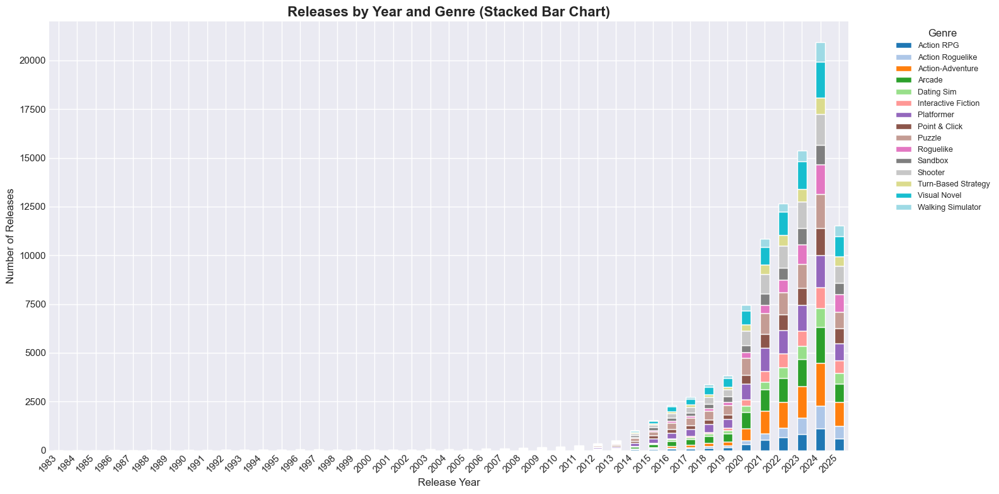

✓ Saved: Stacked bar chart - Releases by Year and Genre


In [39]:
# 1. Stacked bar chart: Releases by Year and Genre

# Split genres (some games have multiple genres separated by commas)
df_genres = df.copy()
df_genres['Genre'] = df_genres['genre'].str.split(', ')
df_genres = df_genres.explode('Genre')
df_genres['Genre'] = df_genres['Genre'].str.strip()

# Get top genres for clarity
top_genres = df_genres['Genre'].value_counts().head(15).index.tolist()
df_genres_filtered = df_genres[df_genres['Genre'].isin(top_genres)].copy()

# Convert Release Year to integer (remove decimal)
df_genres_filtered["Release Year"] = df_genres_filtered["Release Year"].astype(int)

# Group by Year and Genre
year_genre_counts = df_genres_filtered.groupby(['Release Year', 'Genre']).size().unstack(fill_value=0)

# Plot
plt.figure(figsize=(16, 8))
colormap = plt.cm.get_cmap('tab20', 15)  # Use 'tab20' colormap and specify 15 colors
year_genre_counts.plot(kind='bar', stacked=True, ax=plt.gca(), color=colormap.colors)
plt.title('Releases by Year and Genre (Stacked Bar Chart)', fontsize=16, fontweight='bold')
plt.xlabel('Release Year', fontsize=12)
plt.ylabel('Number of Releases', fontsize=12)
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{output_dir}/1_stacked_bar_releases_by_year_genre.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: Stacked bar chart - Releases by Year and Genre")


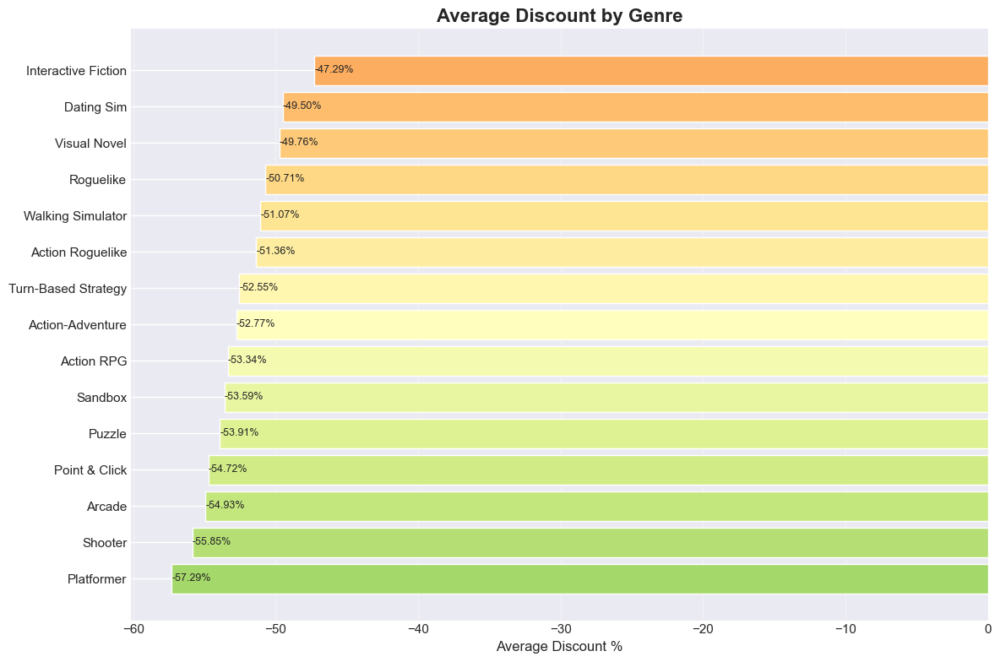

✓ Saved: Bar chart - Average discount by Genre


In [40]:
# 2. Bar chart: Average discount by Genre

# Step 1: Clean the "Discount %" column
# Multiply by 100 to convert the decimal values to percentages
df_genres['Discount %'] = df_genres['Discount %'] * 100

# Step 2: Filter out rows with missing or invalid "Discount %" values
df_genres_clean = df_genres[df_genres['Genre'].isin(top_genres)].copy()
df_genres_clean = df_genres_clean.dropna(subset=['Discount %'])  # Remove NaN values
df_genres_clean = df_genres_clean[df_genres_clean['Discount %'] != '']  # Remove empty strings (if any)

# Step 3: Calculate the average discount by genre
avg_discount = df_genres_clean.groupby('Genre')['Discount %'].mean().sort_values(ascending=True)

# Step 4: Plot the bar chart
plt.figure(figsize=(12, 8))
colors = plt.cm.RdYlGn_r(np.linspace(0.3, 0.7, len(avg_discount)))
bars = plt.barh(range(len(avg_discount)), avg_discount.values, color=colors)
plt.yticks(range(len(avg_discount)), avg_discount.index)
plt.xlabel('Average Discount %', fontsize=12)
plt.title('Average Discount by Genre', fontsize=16, fontweight='bold')
plt.grid(axis='x', alpha=0.3)

# Add text labels with percentage format
for i, v in enumerate(avg_discount.values):
    plt.text(v, i, f'{v:.2f}%', va='center', fontsize=9)

plt.tight_layout()
plt.savefig(f'{output_dir}/2_bar_avg_discount_by_genre.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: Bar chart - Average discount by Genre")


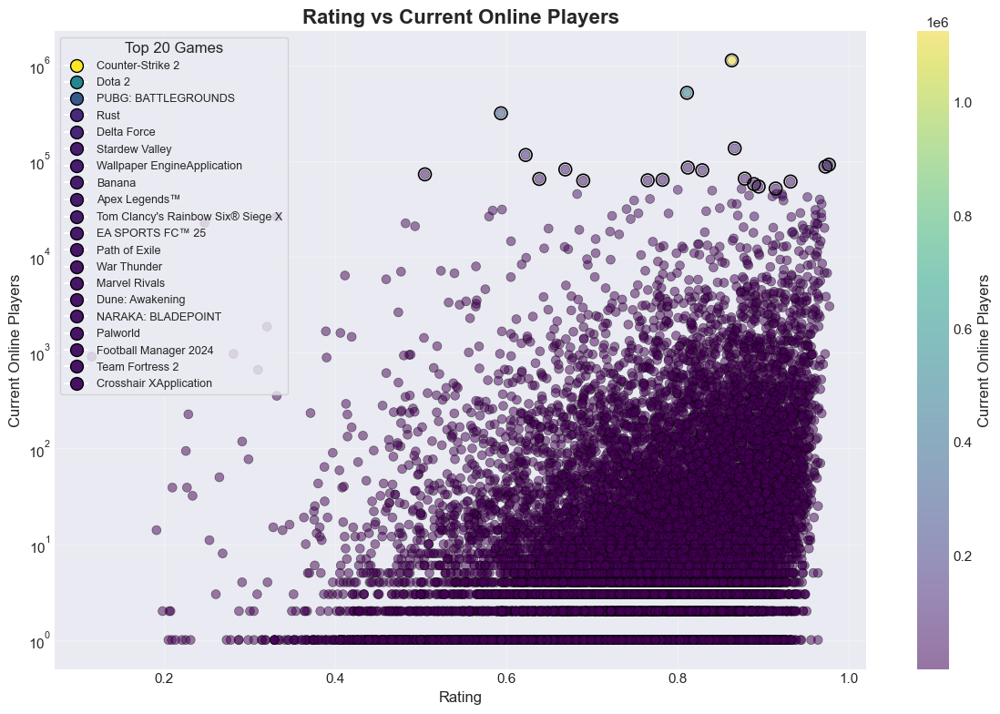

✓ Saved: Scatter plot - Rating vs Current Online Players with Top 20 Legend (log-scaled Y-axis)


In [ ]:
import matplotlib.pyplot as plt

# Clean the data
df_clean = df.dropna(subset=["Rating", "Current Online"])
df_clean = df_clean[df_clean["Current Online"] > 0]  # Filter out zeros

# Sort by 'Current Online Players' and get the top 20
top_20 = df_clean.nlargest(20, "Current Online")

# Plot the scatter plot
plt.figure(figsize=(12, 8))
sc = plt.scatter(
    df_clean["Rating"],
    df_clean["Current Online"],
    alpha=0.5,
    s=50,
    c=df_clean["Current Online"],
    cmap="viridis",
    edgecolors="black",
    linewidth=0.5,
)

plt.xlabel("Rating", fontsize=12)
plt.ylabel("Current Online Players (Log Scale)", fontsize=12)
plt.title("Rating vs Current Online Players", fontsize=16, fontweight="bold")
plt.colorbar(label="Current Online Players")
plt.grid(alpha=0.3)

# Highlight top 20 games (without labels)
plt.scatter(
    top_20["Rating"],
    top_20["Current Online"],
    s=100,
    edgecolors="black",
    linewidth=1.2,
    facecolors="none",
    label="Top 20 Games",
)

# Add a legend using the top 20 games' names
from matplotlib.lines import Line2D

handles = []
for i, row in top_20.iterrows():
    handle = Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        markerfacecolor=plt.cm.viridis(
            row["Current Online"] / df_clean["Current Online"].max()
        ),
        markeredgecolor="black",
        markersize=10,
        label=row["Name"],
    )
    handles.append(handle)

plt.legend(
    handles=handles, loc="upper left", title="Top 20 Games", fontsize=9, frameon=True
)

# --- Log scale for y-axis ---
plt.yscale("log")

# Save and show plot
plt.tight_layout()
plt.savefig(
    f"{output_dir}/3_scatter_rating_vs_current_online_with_legend_log.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print(
    "✓ Saved: Scatter plot - Rating vs Current Online Players with Top 20 Legend (log-scaled Y-axis)"
)


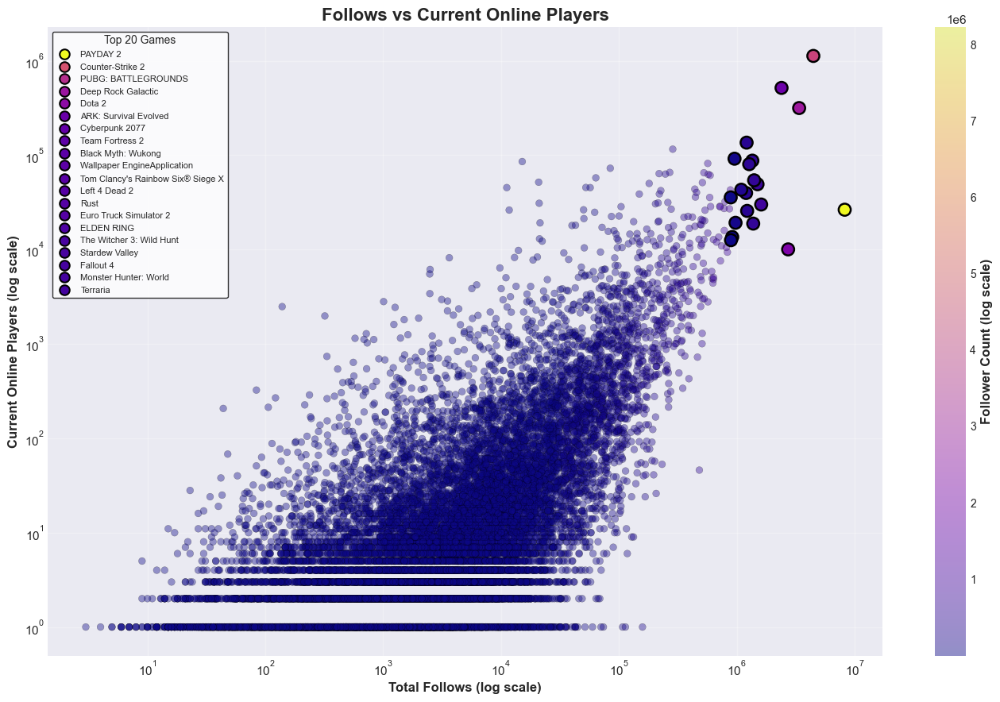

✓ Saved: Scatter plot - Follows vs Current Online Players (Custom Legend for Top 20)


In [77]:
# 4. Scatter plot: Follows vs Current Online Players (Top 20 Highlighted + Custom Legend)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- Clean and prepare data ---
df_clean = df.dropna(subset=["Follows", "Current Online"]).copy()
df_clean = df_clean[(df_clean["Follows"] > 0) & (df_clean["Current Online"] > 0)]

# --- Identify top 20 by follows ---
top_20 = df_clean.nlargest(20, "Follows")

# --- Create figure ---
plt.figure(figsize=(14, 9))

# Base scatter: all games
sc = plt.scatter(
    df_clean["Follows"],
    df_clean["Current Online"],
    alpha=0.4,
    s=40,
    c=df_clean["Follows"],
    cmap="plasma",
    edgecolors="black",
    linewidth=0.3,
    label="_nolegend_",
)

# Highlight top 20: same color, thicker border
plt.scatter(
    top_20["Follows"],
    top_20["Current Online"],
    s=120,
    c=top_20["Follows"],
    cmap="plasma",
    edgecolors="black",
    linewidth=1.8,
    zorder=3,
    label="_nolegend_",
)

# --- Custom legend using Line2D handles for top 20 ---
handles = []
for i, row in top_20.iterrows():
    handle = Line2D(
        [0],
        [0],
        marker="o",
        linestyle="",
        color="w",
        markerfacecolor=plt.cm.plasma(
            (row["Follows"] - df_clean["Follows"].min())
            / (df_clean["Follows"].max() - df_clean["Follows"].min())
        ),
        markeredgecolor="black",
        markeredgewidth=1.5,
        markersize=9,
        label=row["Name"],
    )
    handles.append(handle)

# --- Add legend ---
plt.legend(
    handles=handles,
    loc="upper left",
    title="Top 20 Games",
    fontsize=8,
    title_fontsize=10,
    frameon=True,
    facecolor="white",
    edgecolor="black",
    ncol=1,
)

# --- Colorbar ---
cbar = plt.colorbar(sc)
cbar.set_label("Follower Count (log scale)", fontsize=12, fontweight="bold")
cbar.ax.tick_params(labelsize=10)

# --- Axes, scales, labels ---
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Total Follows (log scale)", fontsize=12, fontweight="bold")
plt.ylabel("Current Online Players (log scale)", fontsize=12, fontweight="bold")
plt.title(
    "Follows vs Current Online Players",
    fontsize=16,
    fontweight="bold",
)

plt.grid(alpha=0.3)
plt.tight_layout()

# --- Save and show ---
plt.savefig(
    f"{output_dir}/4_scatter_follows_vs_current_online_top20_custom_legend.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print(
    "✓ Saved: Scatter plot - Follows vs Current Online Players (Custom Legend for Top 20)"
)


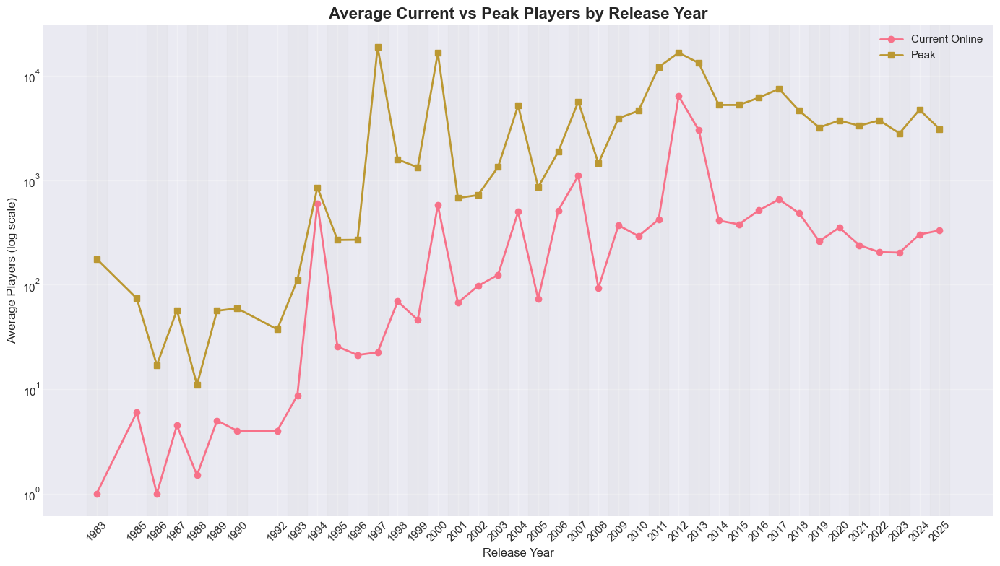

✓ Saved: Line chart - Current vs Peak Players (with colored year bands)


In [43]:
import matplotlib.pyplot as plt
import numpy as np

# Clean and prepare data
df_clean = df.dropna(subset=["Current Online", "Peak", "Release Year"])
df_clean = df_clean[(df_clean["Current Online"] > 0) & (df_clean["Peak"] > 0)]

# Aggregate by year
yearly_stats = (
    df_clean.groupby("Release Year")
    .agg({"Current Online": "mean", "Peak": "mean"})
    .reset_index()
)

# Sort by year
yearly_stats = yearly_stats.sort_values("Release Year")

# Plot setup
plt.figure(figsize=(14, 8))

# Create alternating background colors for each year
years = yearly_stats["Release Year"].tolist()
for i, year in enumerate(years):
    if i % 2 == 0:
        plt.axvspan(year - 0.5, year + 0.5, color="lightgrey", alpha=0.15)

# Plot the lines
plt.plot(
    yearly_stats["Release Year"],
    yearly_stats["Current Online"],
    marker="o",
    label="Current Online",
    linewidth=2,
    markersize=6,
)
plt.plot(
    yearly_stats["Release Year"],
    yearly_stats["Peak"],
    marker="s",
    label="Peak",
    linewidth=2,
    markersize=6,
)

# Axis and style adjustments
plt.xlabel("Release Year", fontsize=12)
plt.ylabel("Average Players (log scale)", fontsize=12)
plt.title(
    "Average Current vs Peak Players by Release Year", fontsize=16, fontweight="bold"
)
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.yscale("log")

# Ensure all years are shown on the x-axis
plt.xticks(years, rotation=45)

# Layout and save
plt.tight_layout()
plt.savefig(
    f"{output_dir}/5_line_current_vs_peak_players_colored_years.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print("✓ Saved: Line chart - Current vs Peak Players (with colored year bands)")


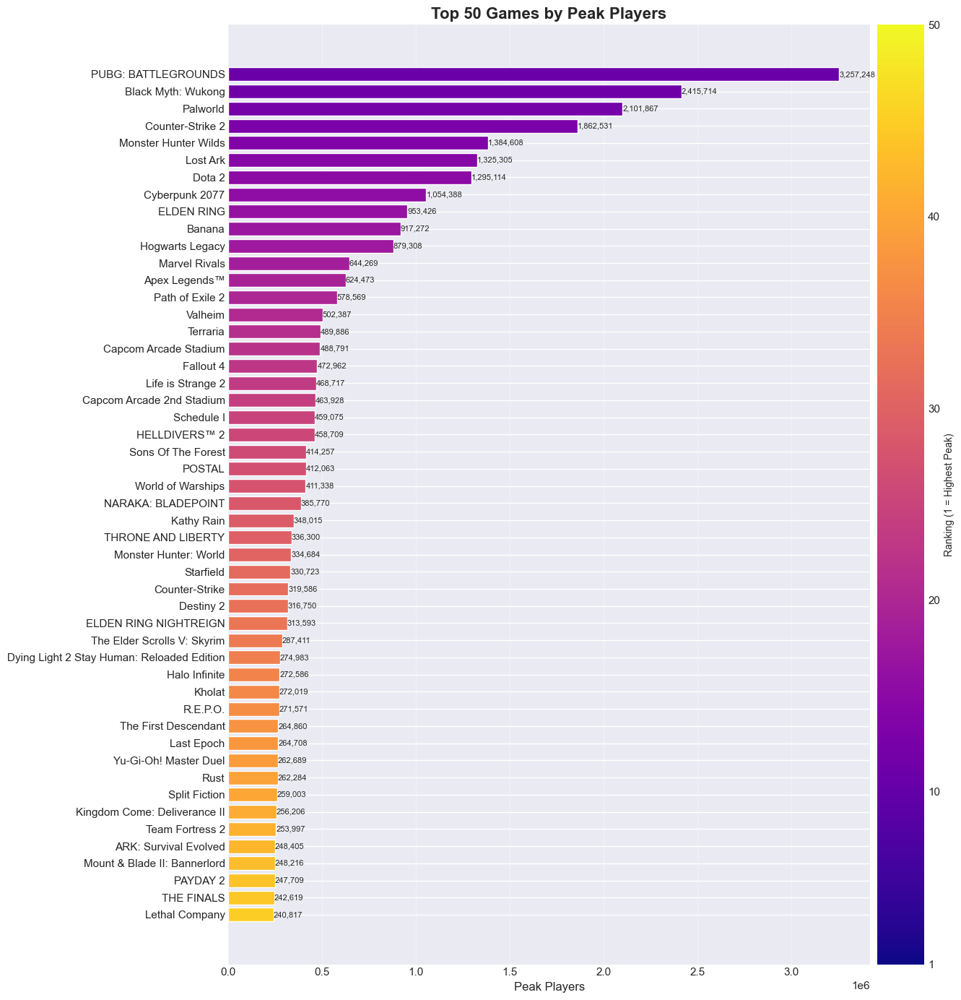

✓ Saved: Bar chart - Top 50 Games by Peak Players (colored by rank)


In [44]:
import matplotlib.pyplot as plt
import numpy as np

# Clean and prepare data
df_clean = df.dropna(subset=["Peak", "Name"])
top_50 = df_clean.nlargest(50, "Peak").reset_index(drop=True)

# Create color gradient (lighter for lower rank, darker for higher)
colors = plt.cm.plasma(
    np.linspace(0.2, 0.9, len(top_50))
)  # 'plasma' gives nice bright-to-dark hues

# Plot
plt.figure(figsize=(14, 14))
bars = plt.barh(range(len(top_50)), top_50["Peak"].values, color=colors)

# Y-axis labels
plt.yticks(range(len(top_50)), top_50["Name"].str[:50])  # Truncate long names
plt.xlabel("Peak Players", fontsize=12)
plt.title("Top 50 Games by Peak Players", fontsize=16, fontweight="bold")
plt.gca().invert_yaxis()
plt.grid(axis="x", alpha=0.3)

# Value labels
for i, v in enumerate(top_50["Peak"].values):
    plt.text(v, i, f"{v:,.0f}", va="center", fontsize=8)

# Add colorbar to show rank meaning
sm = plt.cm.ScalarMappable(cmap="plasma", norm=plt.Normalize(vmin=1, vmax=50))
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca(), pad=0.01)
cbar.set_label("Ranking (1 = Highest Peak)", fontsize=10)
cbar.set_ticks([1, 10, 20, 30, 40, 50])

# Layout and save
plt.tight_layout()
plt.savefig(
    f"{output_dir}/6_bar_top50_by_peak_players_colored.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print("✓ Saved: Bar chart - Top 50 Games by Peak Players (colored by rank)")


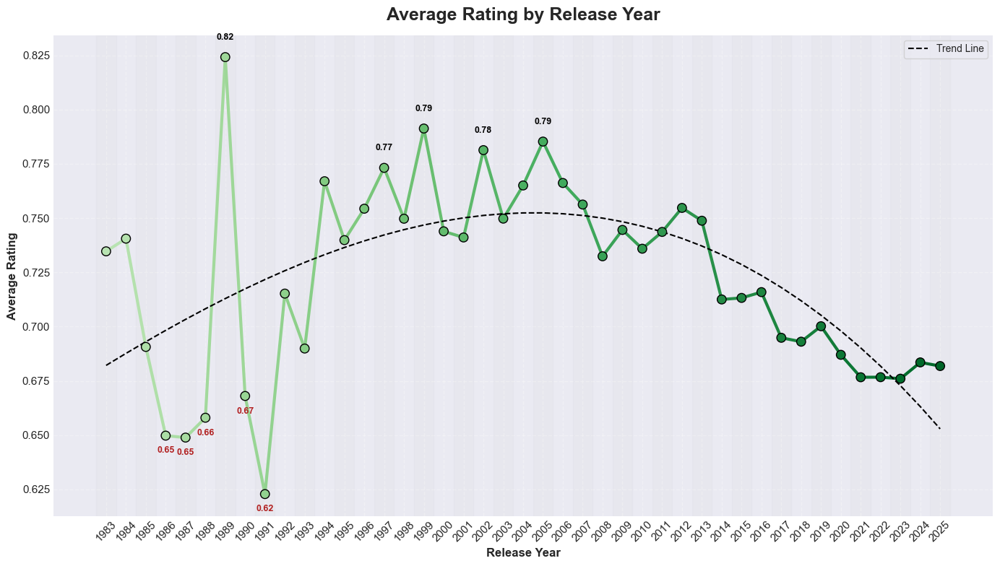

✓ Saved: Stylish Line Chart - Average Rating by Release Year (Top & Bottom Labels, Close to Points)


In [45]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

# Clean data
df_clean = df.dropna(subset=["Rating", "Release Year"])
yearly_rating = df_clean.groupby("Release Year")["Rating"].mean().reset_index()
yearly_rating = yearly_rating.sort_values("Release Year")

# Prepare gradient colors
colors = cm.Greens(np.linspace(0.3, 0.9, len(yearly_rating)))

plt.figure(figsize=(14, 8))

# Add alternating background color bands
years = yearly_rating["Release Year"].tolist()
for i, year in enumerate(years):
    if i % 2 == 0:
        plt.axvspan(year - 0.5, year + 0.5, color="lightgrey", alpha=0.1)

# Gradient line plot
for i in range(len(yearly_rating) - 1):
    plt.plot(
        yearly_rating["Release Year"].iloc[i : i + 2],
        yearly_rating["Rating"].iloc[i : i + 2],
        color=colors[i],
        linewidth=3,
    )

# Points on line
plt.scatter(
    yearly_rating["Release Year"],
    yearly_rating["Rating"],
    color=colors,
    edgecolor="black",
    s=80,
    zorder=5,
)

# Add smooth trend line
z = np.polyfit(yearly_rating["Release Year"], yearly_rating["Rating"], 3)
p = np.poly1d(z)
plt.plot(
    yearly_rating["Release Year"],
    p(yearly_rating["Release Year"]),
    color="black",
    linestyle="--",
    linewidth=1.5,
    label="Trend Line",
)

# Label top 5 highest-rated years (closer to points)
top_years = yearly_rating.nlargest(5, "Rating")
for _, row in top_years.iterrows():
    plt.text(
        row["Release Year"],
        row["Rating"] + 0.008,  # smaller offset
        f"{row['Rating']:.2f}",
        ha="center",
        fontsize=9,
        fontweight="bold",
        color="black",
    )

# Label bottom 5 lowest-rated years (closer to points)
bottom_years = yearly_rating.nsmallest(5, "Rating")
for _, row in bottom_years.iterrows():
    plt.text(
        row["Release Year"],
        row["Rating"] - 0.008,  # smaller offset
        f"{row['Rating']:.2f}",
        ha="center",
        fontsize=9,
        fontweight="bold",
        color="firebrick",
    )

# Style & aesthetics
plt.xlabel("Release Year", fontsize=12, fontweight="bold")
plt.ylabel("Average Rating", fontsize=12, fontweight="bold")
plt.title("Average Rating by Release Year", fontsize=18, fontweight="bold", pad=15)
plt.xticks(years, rotation=45)
plt.grid(alpha=0.3, linestyle="--")
plt.legend(frameon=True, fontsize=10)
plt.tight_layout()

# Save and show
plt.savefig(
    f"{output_dir}/7_line_avg_rating_by_year_styled_top_bottom_close.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print(
    "✓ Saved: Stylish Line Chart - Average Rating by Release Year (Top & Bottom Labels, Close to Points)"
)


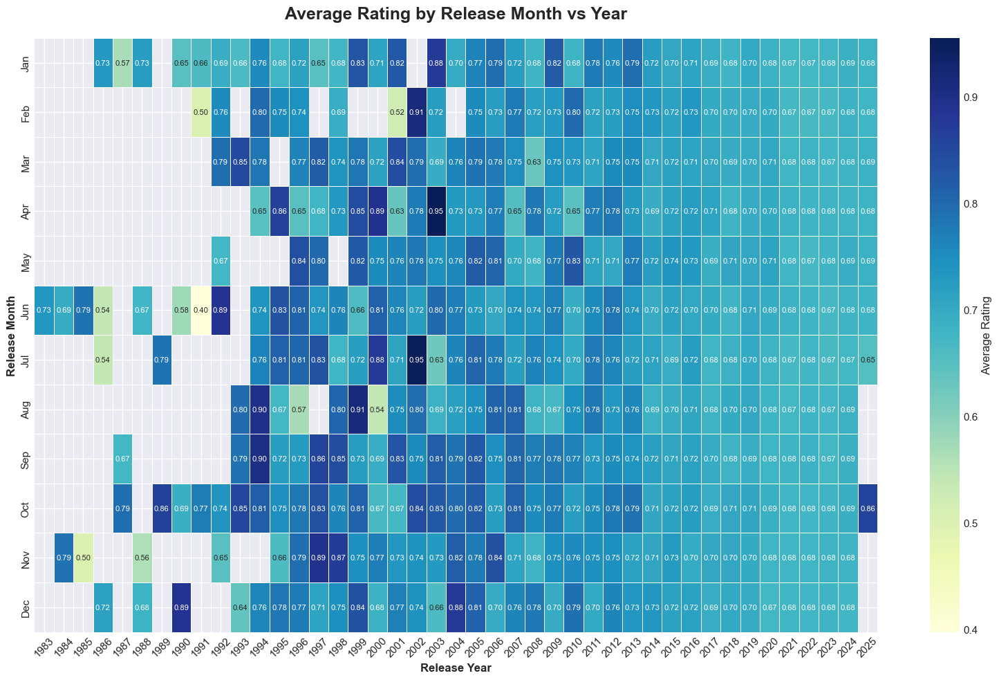

✓ Saved: Heatmap - Average Rating by Release Month vs Year


In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

month_order = [
    "Jan",
    "Feb",
    "Mar",
    "Apr",
    "May",
    "Jun",
    "Jul",
    "Aug",
    "Sep",
    "Oct",
    "Nov",
    "Dec",
]

# Clean data
df_clean = df.dropna(subset=["Release Month", "Release Year", "Rating"])

# Compute average rating per Release Year and Month
month_year_rating = (
    df_clean.groupby(["Release Year", "Release Month"])["Rating"]
    .mean()
    .unstack(fill_value=np.nan)
)

# Reorder columns by month order
existing_months = [m for m in month_order if m in month_year_rating.columns]
month_year_rating = month_year_rating[existing_months]

plt.figure(figsize=(16, 10))

# Plot heatmap
sns.heatmap(
    month_year_rating.T,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",  # average ratings
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Average Rating"},
    annot_kws={"fontsize": 8},
)

# Title and labels
plt.title(
    "Average Rating by Release Month vs Year", fontsize=18, fontweight="bold", pad=20
)
plt.xlabel("Release Year", fontsize=12, fontweight="bold")
plt.ylabel("Release Month", fontsize=12, fontweight="bold")

# Adjust x-axis to show integer years
plt.xticks(
    ticks=np.arange(len(month_year_rating.index)) + 0.5,
    labels=month_year_rating.index.astype(int),
    rotation=45,
)

plt.tight_layout()

# Save & show
plt.savefig(
    f"{output_dir}/8_heatmap_month_vs_year_avg_rating.png", dpi=300, bbox_inches="tight"
)
plt.show()

print("✓ Saved: Heatmap - Average Rating by Release Month vs Year")


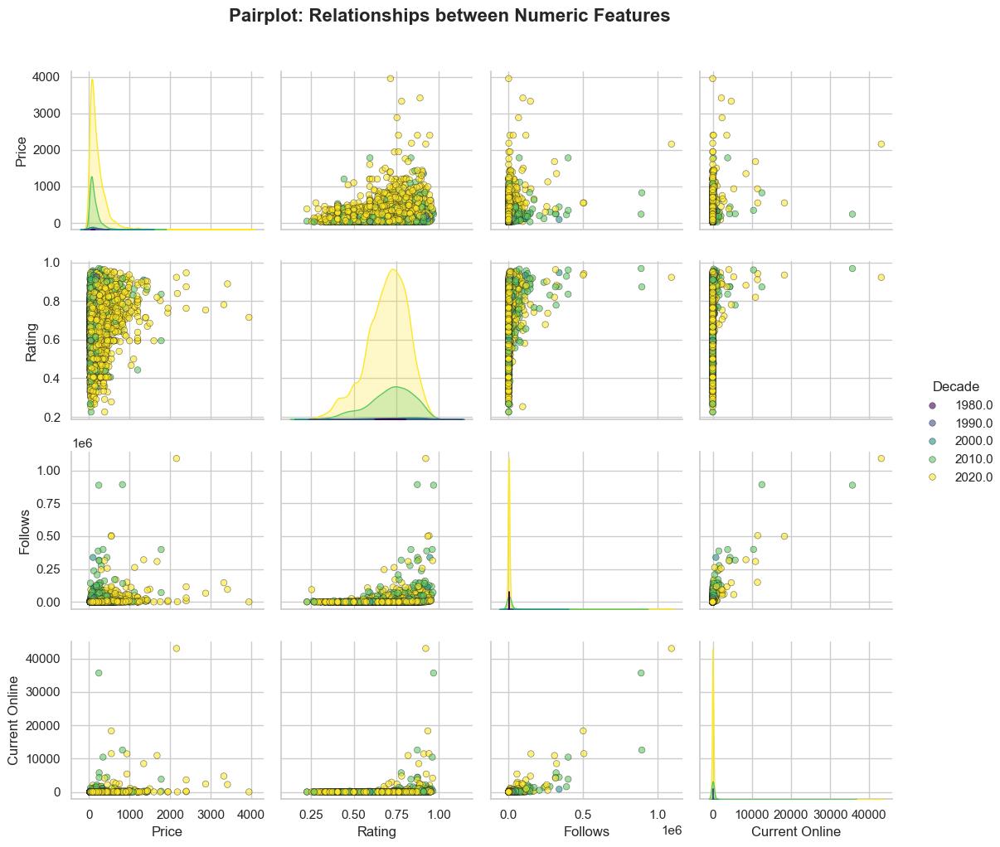

✓ Saved: Improved Pairplot with Legend Outside - Numeric features relationships


In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

numeric_cols = ["Price", "Rating", "Discount %", "Follows", "Current Online", "Peak"]
df_pairplot = df[numeric_cols + ["Release Year"]].dropna()

# Sample if too many points
if len(df_pairplot) > 5000:
    df_pairplot = df_pairplot.sample(n=5000, random_state=42)

# Create a categorical color based on decade of release
df_pairplot["Decade"] = (df_pairplot["Release Year"] // 10) * 10

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.0)

# Create pairplot
pair_plot = sns.pairplot(
    df_pairplot[["Price", "Rating", "Follows", "Current Online", "Decade"]],
    hue="Decade",
    palette="viridis",
    diag_kind="kde",
    plot_kws={"alpha": 0.6, "s": 30, "edgecolor": "k"},
    diag_kws={"shade": True},
)

# Title
pair_plot.fig.suptitle(
    "Pairplot: Relationships between Numeric Features",
    fontsize=16,
    fontweight="bold",
    y=1.02,
)

# Move legend outside the plot
pair_plot._legend.set_bbox_to_anchor((1.1, 0.5))
pair_plot._legend.set_title("Decade")
pair_plot._legend.get_frame().set_edgecolor("black")

# Improve layout
plt.tight_layout()

# Save and show
plt.savefig(
    f"{output_dir}/9_pairplot_numeric_features_styled_legend.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print("✓ Saved: Improved Pairplot with Legend Outside - Numeric features relationships")


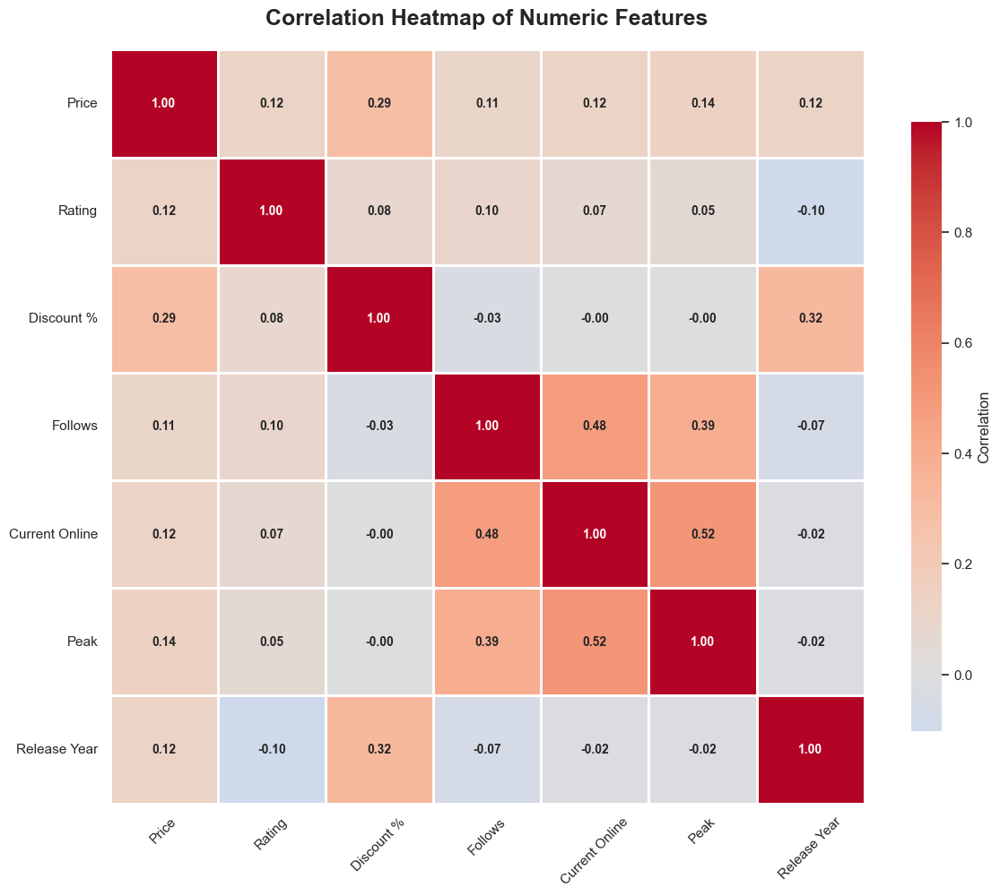

✓ Saved: Stylish Full Correlation Heatmap


In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_cols = [
    "Price",
    "Rating",
    "Discount %",
    "Follows",
    "Current Online",
    "Peak",
    "Release Year",
]
df_corr = df[numeric_cols].dropna()

correlation_matrix = df_corr.corr()

plt.figure(figsize=(12, 10))
sns.set(style="white")  # Clean background

# Plot heatmap without masking
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.8,
    linecolor="white",
    cbar_kws={"label": "Correlation", "shrink": 0.8},
    annot_kws={"fontsize": 10, "weight": "bold"},
)

plt.title(
    "Correlation Heatmap of Numeric Features", fontsize=18, fontweight="bold", pad=20
)
plt.xticks(rotation=45)
plt.yticks(rotation=0)

plt.tight_layout()
plt.savefig(
    f"{output_dir}/10_correlation_heatmap_full.png", dpi=300, bbox_inches="tight"
)
plt.show()

print("✓ Saved: Stylish Full Correlation Heatmap")


In [49]:
import plotly.express as px

# Clean data
df_clean = df.dropna(subset=["Price", "Rating", "Follows", "genre"])
df_clean = df_clean[df_clean["Follows"] > 0]

# Extract main genre
df_clean["Main Genre"] = df_clean["genre"].str.split(",").str[0].str.strip()

# Keep top 20 genres only
top_genres_list = df_clean["Main Genre"].value_counts().head(20).index.tolist()
df_clean = df_clean[df_clean["Main Genre"].isin(top_genres_list)]

# Create 3D scatter plot
fig = px.scatter_3d(
    df_clean,
    x="Price",
    y="Rating",
    z="Follows",
    color="Main Genre",
    size="Rating",
    hover_data=["Name"],
    title="3D Scatter: Price vs Rating vs Follows (Top 20 Genres)",
    labels={"Price": "Price (₹)", "Rating": "Rating", "Follows": "Follows"},
    opacity=0.8,
    width=1200,
    height=900,
)

# Format x-axis to show ₹ symbol
fig.update_layout(
    scene=dict(
        xaxis=dict(
            title="Price (₹)",
            tickprefix="₹",
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="white",
            showbackground=True,
        ),
        yaxis=dict(
            title="Rating",
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="white",
            showbackground=True,
        ),
        zaxis=dict(
            title="Follows",
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="white",
            showbackground=True,
        ),
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    legend=dict(title="Genre", itemsizing="constant"),
    title=dict(x=0.5, xanchor="center", font=dict(size=20)),
    autosize=True,
)

# Center camera and set initial zoom
fig.update_layout(scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.2)))

# Export to HTML (responsive, centered)
fig.write_html(
    f"{output_dir}/11_3d_scatter_price_rating_follows_top20_rupee.html",
    include_plotlyjs="cdn",
    full_html=True,
    config={"responsive": True},
)

fig.show()
print(
    "✓ Saved: 3D Scatter Plot - Price vs Rating vs Follows (Top 20 Genres, ₹ shown, centered & zoomed)"
)


✓ Saved: 3D Scatter Plot - Price vs Rating vs Follows (Top 20 Genres, ₹ shown, centered & zoomed)


In [50]:
import plotly.express as px

# Clean data
df_clean = df.dropna(subset=["Price", "Rating", "Current Online", "genre"])
df_clean = df_clean[df_clean["Current Online"] > 0]

# Extract main genre
df_clean["Main Genre"] = df_clean["genre"].str.split(",").str[0].str.strip()

# Keep top 10 genres only
top_genres_list = df_clean["Main Genre"].value_counts().head(10).index.tolist()
df_clean = df_clean[df_clean["Main Genre"].isin(top_genres_list)]

# Create bubble chart
fig = px.scatter(
    df_clean,
    x="Price",
    y="Rating",
    size="Current Online",
    color="Main Genre",
    hover_data=["Name", "Price", "Rating", "Current Online"],
    title="Bubble Chart: Price vs Rating (Bubble size = Current Online, Color = Genre)",
    labels={"Price": "Price (₹)", "Rating": "Rating"},
    size_max=60,
    opacity=0.7,
)

# Format x-axis with ₹
fig.update_layout(
    xaxis=dict(tickprefix="₹"),
    legend_title_text="Genre",
    legend=dict(itemsizing="constant", title_font=dict(size=12)),
    title=dict(x=0.5, xanchor="center", font=dict(size=18)),
    autosize=True,
    margin=dict(l=50, r=50, t=80, b=50),
)

# Export interactive HTML
fig.write_html(
    f"{output_dir}/12_bubble_price_vs_rating_interactive.html",
    include_plotlyjs="cdn",
    full_html=True,
    config={"responsive": True},
)

fig.show()
print("✓ Saved: Interactive Bubble Chart - Price vs Rating")


✓ Saved: Interactive Bubble Chart - Price vs Rating


In [51]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Metrics to include
metrics = ["Rating", "Price", "Follows", "Current Online", "Discount %"]

# Ensure Discount % exists; fill 0 if missing
if "Discount %" not in df.columns:
    df["Discount %"] = 0
df["Discount %"] = df["Discount %"].fillna(0)

# Explode multiple genres per game
df_genres = df.dropna(subset=["genre", "Rating", "Price", "Follows", "Current Online"])
df_genres["Main Genre"] = (
    df_genres["genre"].str.split(",").apply(lambda x: [g.strip() for g in x])
)
df_exploded = df_genres.explode("Main Genre")

# Keep top 20 genres by frequency
top_genres = df_exploded["Main Genre"].value_counts().head(20).index.tolist()
df_exploded = df_exploded[df_exploded["Main Genre"].isin(top_genres)]

# Compute percentile-based values for each metric
for col in metrics:
    df_exploded[col + "_pct"] = df_exploded[col].rank(pct=True) * 100

# Aggregate by genre (average percentile per metric)
genre_metrics = (
    df_exploded.groupby("Main Genre")[[col + "_pct" for col in metrics]]
    .mean()
    .reset_index()
)

# Number of rows and columns for subplot grid
n_cols = 4
n_rows = (len(top_genres) + n_cols - 1) // n_cols

# Create subplot figure
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    specs=[[{"type": "polar"}] * n_cols] * n_rows,
    subplot_titles=top_genres,
)

# Add each genre as a separate radar
for i, genre in enumerate(top_genres):
    row = i // n_cols + 1
    col = i % n_cols + 1
    values = (
        genre_metrics.loc[
            genre_metrics["Main Genre"] == genre, [c + "_pct" for c in metrics]
        ]
        .values[0]
        .tolist()
    )
    values += values[:1]  # close the radar
    fig.add_trace(
        go.Scatterpolar(
            r=values,
            theta=metrics + [metrics[0]],
            fill="toself",
            name=genre,
            showlegend=False,
        ),
        row=row,
        col=col,
    )

# Update layout
fig.update_layout(
    title_text="Radar Charts: Percentile Metrics per Top 20 Genres (Separate for Each Genre)",
    height=300 * n_rows,
    width=300 * n_cols * 1.2,
    polar=dict(radialaxis=dict(range=[0, 100])),
    showlegend=False,
)

# Export interactive HTML
fig.write_html(
    f"{output_dir}/13_radar_chart_top20_genres_separate.html",
    include_plotlyjs="cdn",
    full_html=True,
    config={"responsive": True},
)

fig.show()
print("✓ Saved: Interactive Radar Charts - Separate per Top 20 Genres")


✓ Saved: Interactive Radar Charts - Separate per Top 20 Genres


In [52]:
import pandas as pd
import plotly.express as px

# Ensure Release Year is integer
df_genres_anim = df_genres.dropna(subset=["Rating", "Release Year", "genre"]).copy()
df_genres_anim["Release Year"] = df_genres_anim["Release Year"].astype(int)

# Explode multiple genres per game
df_genres_anim["Main Genre"] = (
    df_genres_anim["genre"].str.split(",").apply(lambda x: [g.strip() for g in x])
)
df_exploded = df_genres_anim.explode("Main Genre")

# Keep top 10 genres by frequency
top_10_genres = df_exploded["Main Genre"].value_counts().head(10).index.tolist()
df_exploded = df_exploded[df_exploded["Main Genre"].isin(top_10_genres)]

# Aggregate average rating per year per genre
yearly_rating_genre = (
    df_exploded.groupby(["Release Year", "Main Genre"])["Rating"].mean().reset_index()
)

# Create animated line chart
fig = px.line(
    yearly_rating_genre,
    x="Release Year",
    y="Rating",
    color="Main Genre",
    labels={
        "Release Year": "Release Year",
        "Rating": "Average Rating",
        "Main Genre": "Genre",
    },
    title="Rating Trends Over Years by Genre",
    line_shape="spline",
)  # smooth lines

# Fix x-axis to show only integers (no decimals)
fig.update_xaxes(dtick=1)

# Layout improvements
fig.update_layout(
    width=1200,
    height=700,
    xaxis_title="Release Year",
    yaxis_title="Average Rating",
    legend_title_text="Genre",
)

# Export interactive HTML
fig.write_html(
    f"{output_dir}/14_rating_trends_by_genre_fixed.html",
    include_plotlyjs="cdn",
    full_html=True,
    config={"responsive": True},
)

fig.show()
print("✓ Saved: Improved Line Chart - Rating trends by Genre")


✓ Saved: Improved Line Chart - Rating trends by Genre


In [53]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Prepare data
df_genres_ts = df_genres.dropna(
    subset=["Peak", "Current Online", "Release Year", "genre"]
).copy()
df_genres_ts["Main Genre"] = (
    df_genres_ts["genre"].str.split(",").apply(lambda x: [g.strip() for g in x])
)
df_exploded = df_genres_ts.explode("Main Genre")

# Keep top 12 genres
top_12_genres = df_exploded["Main Genre"].value_counts().head(12).index.tolist()
df_exploded = df_exploded[df_exploded["Main Genre"].isin(top_12_genres)]

# Aggregate mean Peak and Current Online per year per genre
yearly_genre_players = (
    df_exploded.groupby(["Release Year", "Main Genre"])
    .agg({"Peak": "mean", "Current Online": "mean"})
    .reset_index()
)

# Create subplots: 3 rows x 4 columns
fig = make_subplots(
    rows=3,
    cols=4,
    subplot_titles=top_12_genres,
    shared_yaxes=False,  # Each subplot has its own y-axis
    vertical_spacing=0.1,
    horizontal_spacing=0.07,
)

# Add traces for each genre
for idx, genre in enumerate(top_12_genres):
    row = idx // 4 + 1
    col = idx % 4 + 1
    genre_data = yearly_genre_players[yearly_genre_players["Main Genre"] == genre]

    # Determine min and max for this genre for y-axis
    y_min = 0
    y_max = genre_data[["Peak", "Current Online"]].max().max() * 1.1

    # Peak line
    fig.add_trace(
        go.Scatter(
            x=genre_data["Release Year"],
            y=genre_data["Peak"],
            mode="lines+markers",
            name="Peak",
            marker=dict(symbol="circle", size=8),
            line=dict(color="steelblue", width=2),
            hovertemplate="Year: %{x}<br>Peak: %{y}<extra></extra>",
        ),
        row=row,
        col=col,
    )

    # Current Online line
    fig.add_trace(
        go.Scatter(
            x=genre_data["Release Year"],
            y=genre_data["Current Online"],
            mode="lines+markers",
            name="Current Online",
            marker=dict(symbol="square", size=8),
            line=dict(color="orange", width=2),
            hovertemplate="Year: %{x}<br>Current: %{y}<extra></extra>",
        ),
        row=row,
        col=col,
    )

    # Set y-axis range per genre
    fig.update_yaxes(range=[y_min, y_max], row=row, col=col)

    # Set x-axis ticks in bins of 5
    fig.update_xaxes(
        tick0=int(yearly_genre_players["Release Year"].min()), dtick=5, row=row, col=col
    )

# Update layout
fig.update_layout(
    height=1000,
    width=1800,
    title="Peak vs Current Online Players Over Time by Top 12 Genres (Interactive, Genre-specific Y-axis)",
    showlegend=True,
)

# Save interactive HTML
fig.write_html(
    f"{output_dir}/15_timeseries_peak_vs_current_top12_interactive_genre_axis.html",
    include_plotlyjs="cdn",
    full_html=True,
    config={"responsive": True},
)

fig.show()
print(
    "✓ Saved: Interactive Time-series - Peak vs Current Players by Top 12 Genres with individual Y-axis"
)


✓ Saved: Interactive Time-series - Peak vs Current Players by Top 12 Genres with individual Y-axis


In [54]:
import pandas as pd
import plotly.graph_objects as go

# ---------------------------
# Prepare data
# ---------------------------

df_ret = df_genres.dropna(
    subset=["Peak", "Current Online", "Release Year", "genre"]
).copy()
df_ret = df_ret[(df_ret["Peak"] > 0) & (df_ret["Current Online"] > 0)]

# Explode multiple genres
df_ret["Main Genre"] = (
    df_ret["genre"].str.split(",").apply(lambda x: [g.strip() for g in x])
)
df_ret = df_ret.explode("Main Genre")

# Keep top 10 genres
top_10_genres = df_ret["Main Genre"].value_counts().head(10).index.tolist()
df_ret = df_ret[df_ret["Main Genre"].isin(top_10_genres)]

# Add Retention column
df_ret["Retention"] = df_ret["Current Online"] / df_ret["Peak"]

# Ensure Release Year exists and is integer
df_ret = df_ret[df_ret["Release Year"].notna()]
df_ret["Release Year"] = df_ret["Release Year"].astype(int)

# Handle Release Month
if "Release Month" in df_ret.columns:
    month_map = {
        "Jan": 1,
        "Feb": 2,
        "Mar": 3,
        "Apr": 4,
        "May": 5,
        "Jun": 6,
        "Jul": 7,
        "Aug": 8,
        "Sep": 9,
        "Oct": 10,
        "Nov": 11,
        "Dec": 12,
    }
    df_ret["Month"] = df_ret["Release Month"].map(month_map).fillna(1).astype(int)
else:
    df_ret["Month"] = 1

# Rename columns to lowercase for pd.to_datetime
df_ret = df_ret.rename(columns={"Release Year": "year", "Month": "month"})
df_ret["day"] = 1

# Create Date column safely
df_ret["Date"] = pd.to_datetime(df_ret[["year", "month", "day"]], errors="coerce")
df_ret = df_ret[df_ret["Date"].notna()]

# ---------------------------
# Aggregate by Date and Genre
# ---------------------------

retention_ts = df_ret.groupby(["Date", "Main Genre"])["Retention"].mean().reset_index()

# ---------------------------
# Create Interactive Plot
# ---------------------------

fig = go.Figure()

for genre in top_10_genres:
    genre_data = retention_ts[retention_ts["Main Genre"] == genre]
    fig.add_trace(
        go.Scatter(
            x=genre_data["Date"],
            y=genre_data["Retention"],
            mode="lines+markers",
            name=genre,
            marker=dict(size=6),
            line=dict(width=2),
            hovertemplate="Date: %{x|%b %Y}<br>Retention: %{y:.2f}<extra></extra>",
        )
    )

# Layout settings
fig.update_layout(
    title="Retention Ratio (Current / Peak) by Genre Over Time",
    xaxis_title="Time Frame",
    yaxis_title="Retention Ratio (Current / Peak)",
    xaxis=dict(
        rangeselector=dict(
            buttons=list(
                [
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(count=3, label="3y", step="year", stepmode="backward"),
                    dict(count=5, label="5y", step="year", stepmode="backward"),
                    dict(step="all", label="All"),
                ]
            )
        ),
        rangeslider=dict(visible=True),
        type="date",
    ),
    yaxis=dict(range=[0, 0.8]),  # updated y-axis range
    legend=dict(title="Genre", orientation="v", x=1.05, y=1),
    height=700,
    width=1200,
)

# Save interactive HTML
fig.write_html(
    f"{output_dir}/16_retention_ratio_interactive.html",
    include_plotlyjs="cdn",
    full_html=True,
    config={"responsive": True},
)

fig.show()
print("✓ Saved: Interactive Retention Plot - (Current / Peak) Ratio by Genre and Date")


✓ Saved: Interactive Retention Plot - (Current / Peak) Ratio by Genre and Date


In [55]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
from matplotlib.colors import to_rgb, to_hex
import re

# ---------------------------
# Detect genre column
# ---------------------------
if "Genre" in df_genres.columns:
    genre_col = "Genre"
elif "genre" in df_genres.columns:
    genre_col = "genre"
else:
    raise ValueError("No genre column found in df_genres")

# ---------------------------
# Prepare data
# ---------------------------
df_sankey = df_genres.copy()
df_sankey["Main Genre"] = (
    df_sankey[genre_col].str.split(",").apply(lambda x: [g.strip() for g in x])
)
df_sankey = df_sankey.explode("Main Genre")

# Limit to top genres
top_20_genres = df_sankey["Main Genre"].value_counts().head(20).index.tolist()
df_sankey = df_sankey[df_sankey["Main Genre"].isin(top_20_genres)]
df_sankey = df_sankey.dropna(subset=["Release Year", "Rating"])

# Year buckets
df_sankey["Year Bucket"] = (df_sankey["Release Year"] // 5) * 5

# Rating percentage and bins
df_sankey["Rating Percent"] = df_sankey["Rating"] * 100
rating_bins = np.arange(0, 110, 10)
rating_labels = [
    f"{int(rating_bins[i])}-{int(rating_bins[i + 1])}%"
    for i in range(len(rating_bins) - 1)
]
df_sankey["Rating Bucket"] = pd.cut(
    df_sankey["Rating Percent"],
    bins=rating_bins,
    labels=rating_labels,
    include_lowest=True,
)

# ---------------------------
# Count flows
# ---------------------------
genre_year = (
    df_sankey.groupby(["Main Genre", "Year Bucket"]).size().reset_index(name="count")
)
year_rating = (
    df_sankey.groupby(["Year Bucket", "Rating Bucket"]).size().reset_index(name="count")
)


# ---------------------------
# Helper: convert rgb() → hex
# ---------------------------
def rgb_to_hex(color):
    if isinstance(color, str) and color.startswith("rgb"):
        nums = list(map(int, re.findall(r"\d+", color)))
        return "#{:02x}{:02x}{:02x}".format(*nums)
    return color


# ---------------------------
# Build node sets
# ---------------------------
all_genres = genre_year["Main Genre"].unique().tolist()
all_years = sorted(df_sankey["Year Bucket"].unique().tolist())
all_ratings = rating_labels
nodes = all_genres + [f"{int(y)}-{int(y + 4)}" for y in all_years] + all_ratings

# ---------------------------
# Fixed color palettes
# ---------------------------
genre_colors = [rgb_to_hex(c) for c in px.colors.qualitative.Vivid]
year_colors = [rgb_to_hex(c) for c in px.colors.sequential.Teal]
rating_colors = [rgb_to_hex(c) for c in px.colors.sequential.Reds]

node_colors = {}
for i, g in enumerate(all_genres):
    node_colors[g] = genre_colors[i % len(genre_colors)]
for i, y in enumerate(all_years):
    node_colors[f"{int(y)}-{int(y + 4)}"] = year_colors[i % len(year_colors)]
for i, r in enumerate(all_ratings):
    node_colors[r] = rating_colors[i % len(rating_colors)]


# ---------------------------
# Gradient generator
# ---------------------------
def get_gradient_rgba(src_color, tgt_color, steps=6):
    """Return gradient rgba strings (source → destination)."""
    src_rgb = np.array(to_rgb(src_color))
    tgt_rgb = np.array(to_rgb(tgt_color))
    colors = []
    for i in range(steps):
        mix = src_rgb + (tgt_rgb - src_rgb) * (i / (steps - 1))
        rgba = f"rgba({int(mix[0] * 255)}, {int(mix[1] * 255)}, {int(mix[2] * 255)}, {0.3 + 0.05 * i})"
        colors.append(rgba)
    return colors


# ---------------------------
# Build links
# ---------------------------
source_list, target_list, value_list, link_colors = [], [], [], []

# Genre → Year
for _, row in genre_year.iterrows():
    src_idx = all_genres.index(row["Main Genre"])
    tgt_idx = len(all_genres) + all_years.index(row["Year Bucket"])
    src_col = node_colors[row["Main Genre"]]
    tgt_col = node_colors[f"{int(row['Year Bucket'])}-{int(row['Year Bucket'] + 4)}"]
    gradient = get_gradient_rgba(src_col, tgt_col)

    for color in gradient:
        source_list.append(src_idx)
        target_list.append(tgt_idx)
        value_list.append(row["count"] / len(gradient))
        link_colors.append(color)

# Year → Rating
for _, row in year_rating.iterrows():
    src_idx = len(all_genres) + all_years.index(row["Year Bucket"])
    tgt_idx = len(all_genres) + len(all_years) + all_ratings.index(row["Rating Bucket"])
    src_col = node_colors[f"{int(row['Year Bucket'])}-{int(row['Year Bucket'] + 4)}"]
    tgt_col = node_colors[row["Rating Bucket"]]
    gradient = get_gradient_rgba(src_col, tgt_col)

    for color in gradient:
        source_list.append(src_idx)
        target_list.append(tgt_idx)
        value_list.append(row["count"] / len(gradient))
        link_colors.append(color)

# ---------------------------
# Sankey Figure
# ---------------------------
fig = go.Figure(
    data=[
        go.Sankey(
            arrangement="snap",
            node=dict(
                pad=15,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=nodes,
                color=[node_colors[n] for n in nodes],
            ),
            link=dict(
                source=source_list,
                target=target_list,
                value=value_list,
                color=link_colors,
            ),
        )
    ]
)

fig.update_layout(
    title_text="🎨 Directional Gradient Sankey: Genre → Time Frame → Rating Flow",
    font_size=12,
    width=1600,
    height=900,
    margin=dict(l=50, r=50, t=80, b=50),
)

fig.write_html(f"{output_dir}/17_sankey_genre_year_rating_directional.html")
fig.show()

print("✅ Sankey with directional gradients saved successfully!")


✅ Sankey with directional gradients saved successfully!


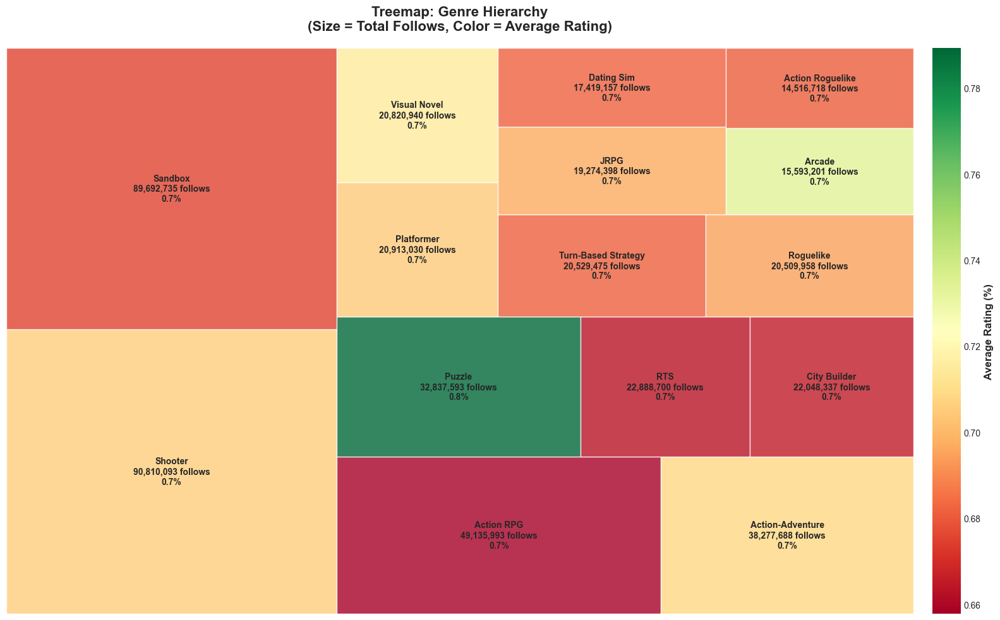

✓ Saved: Treemap - Genre hierarchy (with rating legend)


In [71]:
# 18. Treemap: Genre hierarchy (size = Follows, color = Avg Rating)
import squarify
import matplotlib.pyplot as plt
import matplotlib as mpl

# --- 1. Split multi-genre rows into multiple entries ---
df_genres_expanded = (
    df.assign(genre=df["genre"].str.split(",\s*"))
    .explode("genre")
    .dropna(subset=["genre", "Follows", "Rating"])
)

# --- 2. Clean and normalize numeric fields ---
df_genres_expanded["genre"] = df_genres_expanded["genre"].str.strip()
df_genres_expanded["Follows"] = pd.to_numeric(
    df_genres_expanded["Follows"], errors="coerce"
)
df_genres_expanded["Rating"] = (
    df_genres_expanded["Rating"]
    .astype(str)
    .str.replace("%", "", regex=False)
    .astype(float)
)
df_genres_expanded = df_genres_expanded.dropna(subset=["Follows", "Rating"])

# --- 3. Aggregate total follows and average rating per genre ---
genre_stats = (
    df_genres_expanded.groupby("genre", as_index=False)
    .agg({"Follows": "sum", "Rating": "mean"})
    .sort_values("Follows", ascending=False)
)

# --- 4. Select top 15 genres by total follows ---
genre_stats = genre_stats.head(15)

# --- 5. Normalize color scale based on rating ---
norm = mpl.colors.Normalize(
    vmin=genre_stats["Rating"].min(), vmax=genre_stats["Rating"].max()
)
cmap = plt.cm.RdYlGn
colors = cmap(norm(genre_stats["Rating"]))

# --- 6. Plot treemap ---
fig, ax = plt.subplots(figsize=(16, 10))
squarify.plot(
    sizes=genre_stats["Follows"],
    label=[
        f"{row['genre']}\n{row['Follows']:,.0f} follows\n{row['Rating']:.1f}%"
        for _, row in genre_stats.iterrows()
    ],
    color=colors,
    alpha=0.8,
    text_kwargs={"fontsize": 10, "fontweight": "bold"},
)
ax.set_title(
    "Treemap: Genre Hierarchy\n(Size = Total Follows, Color = Average Rating)",
    fontsize=16,
    fontweight="bold",
    pad=20,
)
ax.axis("off")

# --- 7. Add colorbar (rating gradient legend) ---
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("Average Rating (%)", fontsize=12, fontweight="bold")
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.savefig(
    f"{output_dir}/18_treemap_genre_hierarchy_with_legend.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print("✓ Saved: Treemap - Genre hierarchy (with rating legend)")


In [58]:
# 19. Sunburst Chart: Year → Genre → Game (colored by Rating)

# Prepare data
df_sunburst = df.dropna(subset=['Release Year', 'genre', 'Name', 'Rating']).copy()

# Create year buckets
df_sunburst['Year Bucket'] = (df_sunburst['Release Year'] // 5) * 5
df_sunburst['Year Bucket Label'] = df_sunburst['Year Bucket'].astype(int).astype(str) + '-' + (df_sunburst['Year Bucket'] + 4).astype(int).astype(str)

# Get top genres per year bucket
df_sunburst['Main Genre'] = df_sunburst['genre'].str.split(',').str[0].str.strip()

# Sample data for better performance (top games by rating)
df_sunburst_sample = df_sunburst.nlargest(500, 'Rating')

fig = px.sunburst(df_sunburst_sample, 
                 path=['Year Bucket Label', 'Main Genre', 'Name'],
                 values='Rating',
                 color='Rating',
                 color_continuous_scale='RdYlGn',
                 title='Sunburst Chart: Year → Genre → Game (colored by Rating)',
                 maxdepth=3)

fig.update_layout(width=1000, height=1000)
fig.write_html(f'{output_dir}/19_sunburst_year_genre_game.html')
fig.show()
print("✓ Saved: Sunburst Chart - Year → Genre → Game (interactive HTML)")


✓ Saved: Sunburst Chart - Year → Genre → Game (interactive HTML)


In [59]:
import pandas as pd
import plotly.express as px
import numpy as np

# ---------------------------
# Prepare Data
# ---------------------------
df_bubble = df.dropna(
    subset=["Price", "Rating", "Current Online", "Release Year", "genre"]
).copy()
df_bubble = df_bubble[df_bubble["Current Online"] > 0]

# Convert price to ₹ (assuming USD base)
df_bubble["Price ₹"] = df_bubble["Price"] * 83  # adjust if already in ₹

# Extract main genre
df_bubble["Main Genre"] = df_bubble["genre"].str.split(",").str[0].str.strip()

# Keep top 10 genres
top_genres = df_bubble["Main Genre"].value_counts().head(10).index.tolist()
df_bubble["Main Genre"] = df_bubble["Main Genre"].apply(
    lambda x: x if x in top_genres else "Other"
)

# ---------------------------
# Aggregate by Genre
# ---------------------------
df_bubble_agg = (
    df_bubble.groupby("Main Genre")
    .agg({"Price ₹": "mean", "Rating": "mean", "Current Online": "mean"})
    .reset_index()
)

# Normalize bubble size for better visual scaling
df_bubble_agg["Bubble Size"] = (
    df_bubble_agg["Current Online"] / df_bubble_agg["Current Online"].max()
) * 80 + 20  # ensures small genres are still visible

# ---------------------------
# Auto-fit Axis Range
# ---------------------------
x_min, x_max = df_bubble_agg["Price ₹"].min(), df_bubble_agg["Price ₹"].max()
y_min, y_max = df_bubble_agg["Rating"].min(), df_bubble_agg["Rating"].max()

# Add a small margin (5%)
x_pad = (x_max - x_min) * 0.05
y_pad = (y_max - y_min) * 0.05

x_range = [x_min - x_pad, x_max + x_pad]
y_range = [y_min - y_pad, min(10, y_max + y_pad)]

# ---------------------------
# Create Plot
# ---------------------------
fig = px.scatter(
    df_bubble_agg,
    x="Price ₹",
    y="Rating",
    size="Bubble Size",
    color="Main Genre",
    hover_name="Main Genre",
    range_x=x_range,
    range_y=y_range,
    title="🎮 Genre-wise Average Price (₹) vs Rating (Auto-fit Static Bubble Chart)",
    labels={"Price ₹": "Average Price (₹)", "Rating": "Average Rating"},
    color_discrete_sequence=px.colors.qualitative.Bold,
)

# ---------------------------
# Style and Layout
# ---------------------------
fig.update_layout(
    width=1100,
    height=700,
    plot_bgcolor="rgba(245,245,245,1)",
    paper_bgcolor="rgba(255,255,255,1)",
    font=dict(size=13, family="Arial"),
    title_font=dict(size=22, color="#222", family="Arial Black"),
    xaxis=dict(
        gridcolor="rgba(210,210,210,0.4)", zeroline=False, title_font=dict(size=15)
    ),
    yaxis=dict(
        gridcolor="rgba(210,210,210,0.4)", zeroline=False, title_font=dict(size=15)
    ),
    legend=dict(
        title="🎭 Genre",
        bgcolor="rgba(255,255,255,0.8)",
        bordercolor="rgba(0,0,0,0.1)",
        borderwidth=1,
        x=1.02,
        y=1,
    ),
)

# ---------------------------
# Save & Show
# ---------------------------
fig.write_html(f"{output_dir}/20_static_bubble_chart_rupees_autofit.html")
fig.show()

print("✅ Saved: Auto-fit Static Bubble Chart - Price (₹) vs Rating (interactive HTML)")


✅ Saved: Auto-fit Static Bubble Chart - Price (₹) vs Rating (interactive HTML)
